# Applied Data Science Capstone project - Building a gardian angel for the city of Seattle
##### Project to get the professional certificate for IBM Data Science
##### Authored by: Gibrán Mendoza Magaña
-------------

## Table of contents
* [Understanding the magnitude of our problem](#Understanding)
* [Getting our data](#Getting_data)
* [Importing & Understanding our data](#Data_understanding)
   * [Comments on Collision Identification](#Collid)
   * [Comments on Collision Description](#Colldesc)
   * [Comments on Collision Severity](#Collsev)
   * [Comments on Location Description](#Locdesc)
* [Map of Collisions](#Map)
* [Developing a model](#Model)
    * [Support Vector Machine](#SVM)
    * [Decision Tree](#Decision_tree)


## Understanding the magnitude of our problem <a name="Understanding"></a>

In this project we will use `machine learning` to develop a model that can `warn the driver` for the posibility of them getting into a `car accident`, and its `possible severity`, given the `weather and road conditions`. This could help the driver pay more attention when driving in areas where the probability of an accident is higher, or even change the route to a safer one. 

Car accidents are still the `leading cause of death for Americans under 30`[[1](https://www.cdc.gov/winnablebattles/report/motor.html)], and they also take `billions of dolars off the US economy`[[2](https://crashstats.nhtsa.dot.gov/Api/Public/ViewPublication/812013)]. This is why it is of vital importance to develp a model that can prevent these accidents from happening in the first place, and, hopefully, save as many lives as possible.



## Getting our data <a name="Getting_data"></a>

The City of Seattle has an "[Open Data Program](http://www.seattle.gov/tech/initiatives/open-data/about-the-open-data-program)" in which it took the initiative to release all the data the City generates into its [Open Data Portal](https://data.seattle.gov/). The objective of this program is to [increase the quality of life of its residents]((http://www.seattle.gov/tech/initiatives/open-data/about-the-open-data-program)), so let's take advantage of that and see what we can find on collisions taking place in Seattle. 


The portal has a file called '[Collisions](https://data.seattle.gov/Land-Base/Collisions/9kas-rb8d)' with information containing all types of `collisions taking place from 2004 to the present day (September 15th, 2020)`. The data has 40 different attributes, and more information on this attributes can be found on the ['Attribute Information' (Metadata)](https://www.seattle.gov/Documents/Departments/SDOT/GIS/Collisions_OD.pdf) file.  

## Importing & Understanding our data <a name="Data_understanding"></a>


Let's import our data into a **Pandas DataFrame**, count the **attributes** (num of cols), and **observations** (num of rows) in our data. 

In [1]:
#Import the collisions data from the csv file and save it as a padas dataframe
import pandas as pd 
Collisions = pd.read_csv('..\Data\Collisions.csv')
Collisions.shape

C:\Users\VI0G067\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (35) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


(221525, 40)

Our data has `40 different attributes` and around `221.5k observations`

Let's take a look into the attributes of our the dataframe

In [2]:
Collisions.columns.values

array(['X', 'Y', 'OBJECTID', 'INCKEY', 'COLDETKEY', 'REPORTNO', 'STATUS',
       'ADDRTYPE', 'INTKEY', 'LOCATION', 'EXCEPTRSNCODE', 'EXCEPTRSNDESC',
       'SEVERITYCODE', 'SEVERITYDESC', 'COLLISIONTYPE', 'PERSONCOUNT',
       'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INJURIES',
       'SERIOUSINJURIES', 'FATALITIES', 'INCDATE', 'INCDTTM',
       'JUNCTIONTYPE', 'SDOT_COLCODE', 'SDOT_COLDESC', 'INATTENTIONIND',
       'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'PEDROWNOTGRNT',
       'SDOTCOLNUM', 'SPEEDING', 'ST_COLCODE', 'ST_COLDESC', 'SEGLANEKEY',
       'CROSSWALKKEY', 'HITPARKEDCAR'], dtype=object)

Not all of the columns' names give us a hint on what the values store in there mean. If we take a look into the [Metadata](https://www.seattle.gov/Documents/Departments/SDOT/GIS/Collisions_OD.pdf "SDOT COLLISIONS"), we can understand the meaning of each column on our data set.
After reading the [Metadata](https://www.seattle.gov/Documents/Departments/SDOT/GIS/Collisions_OD.pdf "SDOT COLLISIONS"), we can see that we can classify the variables present in our DataFrame in 4 main categories:

|Collision Identification|Collision Description|Collision Severity|Location Description|
|:----------------------:|:-------------------:|:----------------:|:--------------:|
|Object ID (num)|Under influence? (cat)|Severity Code (num, disc)|X coordinate (num)|
|Incident Key (num)|Innattention? (cat)| Severity Descripction (cat)|Y coordinate (num)|
|Collision Description Key (num)|Speeding? (cat)|Person count (num)|Location (cat)|
|Report No. (num)|SDOT collision code (num)|Pedestrian count (num)|Address Type (cat)|
|Status (cat, bin)|SDOT collision desc (cat)|Bicycle count (num)|Junction type (cat)|
|EXCEPTRSNCODE (cat)|Collision Type (cat)|Vehicle count (num)| Weather (cat)|
|EXCEPTRSNDESC (cat)|Pedestrian right of way not granted? (cat)|Injuries (num)|Road conditions (cat)|
|SDOT collision number (num)|ST Collision code (num)|Serious injuries (num)|Light conditions (cat)|
|Incident date (num)|ST Collision desc (cat)|Fatalities (num)|Lane segment key (num)|
|Incident date and time (num)||Hit parked car (cat)|Crosswalk key (num)
||||Interception Key (num)|


As explained before in our section [Understanding the magnitude of our problem](#Understanding), we will mainly be focusing on `probability of an accident, road conditions, and weather conditions`. Since the project aim is to warn the driver so they can pay more attention to the road they are going in, and/or change their route if possible, we need to include the `location of the accident and time` as well.  

### Comments on Collision Identification <a name="Collid"></a>

Most of the attributes in this column are innerly used by the Seattle Department of Transport to identify the collision, it's location, the intersection closer to the accident, date of incident, time of incident, etc. Most of these attributes have no use other than for admin purposes. For our first run of the model `we will be keeping only the date and time of incident (INCDTTM)`.

In [3]:
Collisions[["OBJECTID","INCKEY","COLDETKEY","REPORTNO","STATUS","EXCEPTRSNCODE","EXCEPTRSNDESC","SDOTCOLNUM","INCDATE","INCDTTM"]]

,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,EXCEPTRSNCODE,EXCEPTRSNDESC,SDOTCOLNUM,INCDATE,INCDTTM
0,1,1003,1003,3503158,Matched,,NaN,NaN,2013/03/14 00:00:00+00,3/14/2013 5:30:00 PM
1,2,56200,56200,1795087,Matched,NaN,NaN,6015003.0,2006/01/15 00:00:00+00,1/15/2006 5:35:00 PM
2,3,327037,328537,E979380,Matched,,NaN,NaN,2019/09/09 00:00:00+00,09/09/2019 15:32
3,4,327278,328778,E996362,Unmatched,,NaN,NaN,2019/12/19 00:00:00+00,12/19/2019
4,5,1248,1248,3645424,Unmatched,,NaN,NaN,2013/03/27 00:00:00+00,3/27/2013
...,...,...,...,...,...,...,...,...,...,...
221520,221521,326318,327818,3747069,Matched,,NaN,NaN,2019/11/27 00:00:00+00,11/27/2019 12:20:00 PM
221521,221522,326625,328125,E990871,Matched,,NaN,NaN,2019/12/08 00:00:00+00,12/08/2019 15:05
221522,221523,324392,325892,E966052,Matched,,NaN,NaN,2019/09/28 00:00:00+00,9/28/2019 4:17:00 PM
221523,221524,325783,327283,E979936,Matched,,NaN,NaN,2019/11/06 00:00:00+00,11/06/2019 10:54


As you can see, some of these variables are `redundant` (i.e INCKEY vs COLDETKEY), `provide little to no information` and no more details were found on the [Metadata](https://www.seattle.gov/Documents/Departments/SDOT/GIS/Collisions_OD.pdf) (i.e. EXCEPTRSNCODE vs EXCEPTRSNDESC). `INCDTTM provides more detailed information than INCDATE`, which is why we are keeping INCDTTM in our DataFrame.

In [4]:
Collisions.drop(["OBJECTID","INCKEY","COLDETKEY","REPORTNO","STATUS","EXCEPTRSNCODE","EXCEPTRSNDESC","SDOTCOLNUM","INCDATE"], axis=1, inplace=True)
print("Columns dropped successfully")
Collisions.shape

Columns dropped successfully


(221525, 31)

### Comments on Collision Description <a name="Colldesc"></a>

The 'Collision Description' column has many valuable attributes that describe either the `state of the driver` (driving under influence, speeding, etc), and the `type of collision, vehicles involved, and angle of collision` (ST collision code, SDOT collision code, collision type, etc.). `Some of these attributes are merely a description of a numerical attribute`; for example, `'ST Collision Code'` is a number between 0 and 88 provided by the State of Washington to describe a collision; whereas `"ST Collision Code Description"` is a descriptión of the numerical variable 'ST Collision Code'. If "ST Collision Code" is 0 (describing a motor vehicle going straight, then hitting a pedestrian), then "ST Collision Code Description" will be "Vehicle going straight hits pedestrian". Using these two variables would cause redundancy in our model. The `same situation` happens with the variables `'SDOT Collision Code' and 'SDOT Collision Description'.`

`We are gonna keep the SDOT Collision Code variable` since it is `more specific` of the element of traffic `striking` and element of traffic `being struck`. We are also gonna keep the `SDOT Collision Code Description` attribute, but `only for plotting purposes`. 

Let's take a look into the other variables before dropping some of them:

In [5]:
Collisions[["UNDERINFL","INATTENTIONIND","SPEEDING","SDOT_COLCODE","SDOT_COLDESC","COLLISIONTYPE","PEDROWNOTGRNT","ST_COLCODE","ST_COLDESC"]]

,UNDERINFL,INATTENTIONIND,SPEEDING,SDOT_COLCODE,SDOT_COLDESC,COLLISIONTYPE,PEDROWNOTGRNT,ST_COLCODE,ST_COLDESC
0,N,NaN,NaN,18.0,"MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END A...",Cycles,Y,45,Vehicle - Pedalcyclist
1,0,NaN,NaN,24.0,MOTOR VEHCILE STRUCK PEDESTRIAN,Pedestrian,NaN,0,Vehicle going straight hits pedestrian
2,N,NaN,NaN,14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",Angles,NaN,10,Entering at angle
3,NaN,NaN,NaN,14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",NaN,NaN,,NaN
4,NaN,NaN,NaN,0.0,NOT ENOUGH INFORMATION / NOT APPLICABLE,NaN,NaN,,NaN
...,...,...,...,...,...,...,...,...,...
221520,N,Y,NaN,14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",Rear Ended,NaN,14,From same direction - both going straight - on...
221521,N,NaN,NaN,11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",Parked Car,NaN,32,One parked--one moving
221522,N,NaN,NaN,16.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...",Parked Car,NaN,32,One parked--one moving
221523,N,NaN,NaN,11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",Angles,NaN,10,Entering at angle


We can see that the attribute `"Collision type"` can provide us we more insight into the `characteristics of the collision`, whether a parked car was hit, weather collision happened at an angle, etc. Let's use the 'value_counts()' function to determine if these attribute has enough values for it to be used in our model. 

In [6]:
print(Collisions['COLLISIONTYPE'].value_counts())
print(Collisions['COLLISIONTYPE'].isnull().value_counts())

Parked Car    48551
Angles        35573
Rear Ended    34691
Other         24588
Sideswipe     18891
Left Turn     14115
Pedestrian     7666
Cycles         5932
Right Turn     3017
Head On        2188
Name: COLLISIONTYPE, dtype: int64
False    195212
True      26313
Name: COLLISIONTYPE, dtype: int64


Some 26,313 values are NaN and other 24,588 values are classified as "Other". This leave us with around 171K values to use. We will keep this attribute.

`Driving under the influence of any substance, texting while driving, speeding, etc` are all `risky behaviours` that can produce an `accident no matter the circunstances`; therefore, these variables `could bias our data` as sobber drivers paying attention to the road and driving at the right speed could clear any obstacle/situation in the road that a risky driver wouldn't. However, it is also possible that an alert could warn the driver that speeding or inattention to the road could cause an accident, and prevent it from happening on the first place. 

As this project aims to predict the severity of an accident, let's see if we can find a correlation between the different attributes of severity we have vs the risky behaviours mentioned above. 

Let's see how the variables are presented in our df

In [7]:
#print the different values of these attributes and number of measurements of such values.
print(Collisions['UNDERINFL'].value_counts())
print(Collisions['INATTENTIONIND'].value_counts())
print(Collisions['SPEEDING'].value_counts())
print(Collisions['PEDROWNOTGRNT'].value_counts())

N    103927
0     81676
Y      5399
1      4230
Name: UNDERINFL, dtype: int64
Y    30188
Name: INATTENTIONIND, dtype: int64
Y    9929
Name: SPEEDING, dtype: int64
Y    5195
Name: PEDROWNOTGRNT, dtype: int64


We can see that "UNDERINFL" is presented with both num and cat values, let's convert all the values to numerical values

In [8]:
import numpy as np
Collisions['UNDERINFL'].replace(to_replace=['N','Y'], value=[0,1], inplace=True)
Collisions['INATTENTIONIND'].replace(to_replace=[np.nan, 'Y'], value=[0,1], inplace=True)
Collisions['SPEEDING'].replace(to_replace=[np.nan, 'Y'], value=[0,1], inplace=True)
Collisions['PEDROWNOTGRNT'].replace(to_replace=[np.nan, 'Y'], value=[0,1], inplace=True)

Metadata mentions that the severity of a variable is measured as 0, 1, 2, 2b and 3. Where 0 is unknown, 1 is property damage, 2 is injury, 2b is serious injury and 3 is fatality. Let's drop the unknowns, convert 2b to 3 and 3 to 4 to be able to determine the correlation between severity and the 4 variables above. 

In [9]:
Collisions.drop(Collisions[Collisions['SEVERITYCODE']=='0'].index, axis = 0, inplace=True)
Collisions['SEVERITYCODE'].replace(to_replace=['2b', '3'], value=[3,4], inplace=True)
Collisions['SEVERITYCODE'].value_counts()
print("NaNs dropped successfully")
Collisions.shape

NaNs dropped successfully


(199910, 31)

Now let's find our correlations:

In [10]:
#delete na's
Collisions.dropna(subset=['SEVERITYCODE','UNDERINFL','INATTENTIONIND','SPEEDING','PEDROWNOTGRNT'], axis=0, inplace=True)
print("NaNs dropped successfully")
Collisions.shape
#convert variables in underinfl and severitycode to ints, as they were stored as strings
Collisions['SEVERITYCODE']=Collisions['SEVERITYCODE'].astype("int")
Collisions['UNDERINFL']=Collisions['UNDERINFL'].astype("int")
#get pearsons correlations
Collisions[['SEVERITYCODE','UNDERINFL','INATTENTIONIND','SPEEDING','PEDROWNOTGRNT', 'PERSONCOUNT','PEDCOUNT','PEDCYLCOUNT','VEHCOUNT', 'INJURIES', 'SERIOUSINJURIES', 'FATALITIES']].corr(method='pearson')

NaNs dropped successfully


,SEVERITYCODE,UNDERINFL,INATTENTIONIND,SPEEDING,PEDROWNOTGRNT,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES
SEVERITYCODE,1.000000,0.067153,0.030832,0.058719,0.219040,0.120271,0.287759,0.219268,-0.110754,0.775524,0.338765,0.205269
UNDERINFL,0.067153,1.000000,-0.028585,0.097047,-0.015460,0.022560,0.026664,-0.017564,-0.014969,0.052391,0.044566,0.042950
INATTENTIONIND,0.030832,-0.028585,1.000000,-0.052178,-0.029680,0.070928,-0.009211,0.001049,0.049847,0.035833,-0.011928,-0.012077
SPEEDING,0.058719,0.097047,-0.052178,1.000000,-0.030588,-0.002338,-0.032988,-0.022680,-0.047382,0.053009,0.039191,0.042554
PEDROWNOTGRNT,0.219040,-0.015460,-0.029680,-0.030588,1.000000,-0.029642,0.487094,0.317479,-0.279246,0.113064,0.067060,0.030116
PERSONCOUNT,0.120271,0.022560,0.070928,-0.002338,-0.029642,1.000000,-0.021398,-0.040982,0.401286,0.278525,0.104639,0.046370
PEDCOUNT,0.287759,0.026664,-0.009211,-0.032988,0.487094,-0.021398,1.000000,-0.020223,-0.324209,0.159682,0.130452,0.073042
PEDCYLCOUNT,0.219268,-0.017564,0.001049,-0.022680,0.317479,-0.040982,-0.020223,1.000000,-0.308649,0.115125,0.060485,0.010467
VEHCOUNT,-0.110754,-0.014969,0.049847,-0.047382,-0.279246,0.401286,-0.324209,-0.308649,1.000000,0.026687,-0.047116,-0.028956
INJURIES,0.775524,0.052391,0.035833,0.053009,0.113064,0.278525,0.159682,0.115125,0.026687,1.000000,0.279713,0.067028


We can see that, apart from the pedestrian right of way  not being granted, there are almost no correlations between the risky behaviours mentioned above and the severity attributes on our df. As mentioned previously, risky driving will generate an accident regardless of road and weather conditions, so we will delete the measurements where a risky behaviours caused an accident. 

In [11]:
Collisions.drop(Collisions[Collisions['UNDERINFL']==1].index, axis=0, inplace=True)
Collisions.drop(Collisions[Collisions['INATTENTIONIND']==1].index, axis=0, inplace=True)
Collisions.drop(Collisions[Collisions['SPEEDING']==1].index, axis=0, inplace=True)
print("Rows dropped successfully")
Collisions.shape

Rows dropped successfully


(148588, 31)

Let's drop the attributes dedicated to "collision description" that we will not be using. 

In [12]:
Collisions.drop(["SPEEDING","INATTENTIONIND","UNDERINFL","ST_COLCODE","ST_COLDESC"], axis=1, inplace=True)
print("Columns dropped successfully")
Collisions.shape

Columns dropped successfully


(148588, 26)

### Comments on Collision Severity <a name="Collsev"></a>

These column containts the `attributes that describe the degree of severity of each collision`, whether it produced property damage, injuries, serious injuries or fatalities, the number of pedestrians, bicicles, vehicles involved, etc. These all can be used in our model.

Unortunately the Metadata does not describe how the SEVERITYCODE variable was calculated, we only now that the variables: "Severity Code" and "Severity Description" are just the numerical and categorical interpretation of the same observation. We will keep the numerical variable "Severity Code". 

Let's keep all the rest in our firsth approach to the model.

In [13]:
#Collisions[['SEVERITYCODE', 'PERSONCOUNT','PEDCOUNT','PEDCYLCOUNT','VEHCOUNT', 'INJURIES', 'SERIOUSINJURIES', 'FATALITIES']].corr(method='pearson')

In [14]:
Collisions.drop(['SEVERITYDESC'], axis=1, inplace=True)
print("Columns dropped successfully")
Collisions.shape

Columns dropped successfully


(148588, 25)

### Comments on Location Description <a name="Locdesc"></a>

This columns containts the attributes that describe the location where the collition took place, the address, type of location, weather, road conditions, light conditions, the number of the intersection where the collision took place, etc.

For our first approach to the model, let's keep the coordinates, address type, weather, road conditions and light conditions, and drop the other variables.


In [15]:
Collisions.drop(['LOCATION','JUNCTIONTYPE','SEGLANEKEY','CROSSWALKKEY','INTKEY'], axis=1, inplace=True)
print("Columns dropped successfully")
Collisions.shape

Columns dropped successfully


(148588, 20)

## Map of Collisions <a name="Map"></a>

In [16]:
#!conda install -c conda-forge folium=0.5.0 --yes
import folium

### Coordinates referencing system

Notice that the coordinates seem to be in UTM. According to the seattle webpage https://gisdata.seattle.gov/server/rest/services/SDOT/SDOT_Collisions/MapServer/0 , they are in spatial reference 2926

Include information on what is a reference system and why we are converting to WGS84/EPSG 4326
See pyproj documentation http://pyproj4.github.io/pyproj/stable/
See folium documentation https://python-visualization.github.io/folium/modules.html#module-folium.map for default EPSG used

In [17]:
#Let's convert the coordinates from EPSG2926 to the universal WGS84 
#Let's get the coordinages from our dataframe
x_coords = np.array(Collisions['X'])
y_coords = np.array(Collisions['Y'])

In [18]:
#Install pyproj, python interface to PROJ(Cartographic projections and coordinate transformations library)

#!pip install pyproj
from pyproj import Proj, transform

inProj  = Proj("+init=EPSG:2926",preserve_units=True) #our spatial reference according to Seattle's Geographical information system's Department
#preserve_units is set as true as our units are in feet.
outProj = Proj("+init=EPSG:4326") # we convert to WGS84 as it is in degrees and not EPSG:3857, which is in meters

#get the transformed values and save them in our data frame
Collisions['X'], Collisions['Y'] =transform(inProj,outProj,x_coords, y_coords)

C:\Users\VI0G067\Anaconda3\lib\site-packages\pyproj\crs\crs.py:280: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(projparams)
C:\Users\VI0G067\Anaconda3\lib\site-packages\pyproj\crs\crs.py:280: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(projparams)
<ipython-input-18-bffbefb56e63>:11: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  Collisions['X'], Collisions['Y'] =transform(inProj,outPro

In [19]:
Collisions.head(2)

,X,Y,ADDRTYPE,SEVERITYCODE,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDTTM,SDOT_COLCODE,SDOT_COLDESC,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,HITPARKEDCAR
0,-122.344896,47.717173,Block,2,Cycles,2,0,1,1,1,0,0,3/14/2013 5:30:00 PM,18.0,"MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END A...",Clear,Dry,Daylight,1,N
1,-122.376467,47.543774,Block,2,Pedestrian,7,1,0,1,1,0,0,1/15/2006 5:35:00 PM,24.0,MOTOR VEHCILE STRUCK PEDESTRIAN,Overcast,Dry,Dark - Street Lights On,0,N


In [20]:
Collisions.columns.values

array(['X', 'Y', 'ADDRTYPE', 'SEVERITYCODE', 'COLLISIONTYPE',
       'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INJURIES',
       'SERIOUSINJURIES', 'FATALITIES', 'INCDTTM', 'SDOT_COLCODE',
       'SDOT_COLDESC', 'WEATHER', 'ROADCOND', 'LIGHTCOND',
       'PEDROWNOTGRNT', 'HITPARKEDCAR'], dtype=object)

Since the objective of our project is to predict the probability of an accident occuring to a driver given weather and road conditions, as well as the severity of the accident, some of the variables shown above are more relevant than others for our model. For instance, the **Severity Code** variable `SEVERITYCODE` is one of our most important variables as we want to predict the severity of a possible accident.  
Let's take a look into this variable:

In [21]:
Collisions['SEVERITYCODE'].value_counts()

1    104773
2     41562
3      2077
4       176
Name: SEVERITYCODE, dtype: int64

Since we are trying to determine the severity of a possible accident we need to get rid of unknown values.

In [22]:
Collisions.shape

(148588, 20)

In [23]:
#We will map our data in order to see if there's a pattern on car collisions in Seattle.

#For this map we will only pic the location of the collision, the severitycode and severity description
Coordinates = Collisions[['SEVERITYCODE', 'X', 'Y', 'SDOT_COLDESC']]

#Let's drop na values for our coordinates df
Coordinates.dropna(axis=0, inplace=True)
Coordinates.shape

<ipython-input-23-2269d88174ba>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Coordinates.dropna(axis=0, inplace=True)


(144737, 4)

In [24]:
#We want the map to show is different colors on the map, depending on how severe the accident is.

#Severity is described by the severitycode value on our df
Coordinates['SEVERITYCODE'].value_counts()

1    101573
2     40937
3      2052
4       175
Name: SEVERITYCODE, dtype: int64

In [25]:
#Let's use a dictionary to create a column with a color code depending on how severe the accident is. 
Coordinates['Color']=Coordinates['SEVERITYCODE'].replace(to_replace=[1,2,3,4], value=["lightblue","orange","red","black"], inplace=False)
Coordinates.head()

<ipython-input-25-4cbbb5373d90>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Coordinates['Color']=Coordinates['SEVERITYCODE'].replace(to_replace=[1,2,3,4], value=["lightblue","orange","red","black"], inplace=False)


,SEVERITYCODE,X,Y,SDOT_COLDESC,Color
0,2,-122.344896,47.717173,"MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END A...",orange
1,2,-122.376467,47.543774,MOTOR VEHCILE STRUCK PEDESTRIAN,orange
2,1,-122.360735,47.701487,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",lightblue
5,2,-122.328550,47.704996,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",orange
6,1,-122.338635,47.625796,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",lightblue


In [26]:
#Let's repeat the same process but now to create a colum with the size of the radius of the circle markers on the map.
Coordinates['Radius']=Coordinates['SEVERITYCODE'].replace(to_replace=[1,2,3,4], value=[3,6,12,18], inplace=False)
Coordinates.shape

<ipython-input-26-507cf403cd2f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Coordinates['Radius']=Coordinates['SEVERITYCODE'].replace(to_replace=[1,2,3,4], value=[3,6,12,18], inplace=False)


(144737, 6)

In [27]:
#There are 149,269 records in our dataframe

#Let's reduce the data set to the collisions registered during the last 4 years.

#Collisions['year']=pd.to_datetime(Collisions['INCDATE'])
#Collisions['year']=Collisions['year'].dt.year
#Collisions=Collisions[Collisions['year']== 2015]

#Let's randomly pick 5% or our data and plot it in our map.

#Get the value of "5% of our dataset's size"
perc = Coordinates.shape[0]*0.05 
perc=round(perc)
perc

#Randomply pic 5% of the dataframe values
Coordinates_5p = Coordinates.sample(perc)
print(Coordinates_5p.shape)

#Let's create a map where we can plot the location of our points

(7237, 6)


In [28]:
Coordinates_5p['SEVERITYCODE'].value_counts()

1    5092
2    2036
3     104
4       5
Name: SEVERITYCODE, dtype: int64

In [29]:
Coordinates_5p.head()

,SEVERITYCODE,X,Y,SDOT_COLDESC,Color,Radius
33890,2,-122.329988,47.579810,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",orange,6
145160,1,-122.381979,47.533545,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",lightblue,3
124223,1,-122.316051,47.659830,NOT ENOUGH INFORMATION / NOT APPLICABLE,lightblue,3
209140,1,-122.311569,47.601683,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",lightblue,3
13670,1,-122.296682,47.576147,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",lightblue,3


In [30]:
#Let's plot our nearly 15k points to see if there's a visible pattern lying in our data.
#We will pick the locaiton of the center of the map as the mean of our coordinates.
project_map=folium.Map(location=[Coordinates_5p.Y.mean(), Coordinates_5p.X.mean()], zoom_start=11, tiles='Stamen Terrain')

In [31]:
#Based on the min lat and longs found in the df, we can confirm that the points contain locations in the Seattle area.
#Lets plot the points and the severity to better understand our data.

#Select a random sample from the whole database (otherwise this will take a long time)

for lat, lng, color, label, rad in zip(Coordinates_5p.Y, Coordinates_5p.X, Coordinates_5p.Color, Coordinates_5p.SDOT_COLDESC, Coordinates_5p.Radius):
    folium.features.CircleMarker(
        [lat, lng],
        radius= rad, # the higher the severity of the accident, the bigger the circle
        color='black',
        fill=True,
        popup=label,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(project_map)


In [32]:
project_map

**Traffic seems to be scattered around the whole city, but there also appears to be a concentration of colllisions in and around Downtown Seattle.**
We'll need further data analysis to find a pattern

## Developing a model <a name="Model"></a>

### Support Vector Machine <a name="SVM"></a>

In [33]:
import pylab as pl
import scipy.optimize as opt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

Let's divide our dataset into a training/testing set

In [34]:
Collisions.dropna(axis=0, inplace=True)
SVMODEL = Collisions[['X','Y','SDOT_COLCODE','SEVERITYCODE']]
SVMODEL[['WEATHER','ROADCOND','LIGHTCOND']] = Collisions[['WEATHER','ROADCOND','LIGHTCOND']].astype('category')
SVMODEL['WEATHER'] = SVMODEL['WEATHER'].cat.codes
SVMODEL['ROADCOND'] = SVMODEL['ROADCOND'].cat.codes
SVMODEL['LIGHTCOND'] = SVMODEL['LIGHTCOND'].cat.codes


C:\Users\VI0G067\Anaconda3\lib\site-packages\pandas\core\frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
<ipython-input-34-ac053a9b8afe>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SVMODEL['WEATHER'] = SVMODEL['WEATHER'].cat.codes
<ipython-input-34-ac053a9b8afe>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

In [35]:
X = SVMODEL[['X','Y','SDOT_COLCODE','WEATHER','ROADCOND','LIGHTCOND']] #Define our dependent variables
y = SVMODEL[['SDOT_COLCODE']] #Define our independent variables

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.4, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (86620, 6) (86620, 1)
Test set: (57748, 6) (57748, 1)


In [36]:
SVMODEL['SDOT_COLCODE'].value_counts()

11.0    70665
14.0    34397
16.0     7955
0.0      6018
24.0     5791
28.0     4806
13.0     4623
18.0     2639
26.0     2138
15.0     1342
12.0     1209
51.0     1145
29.0      365
56.0      148
21.0      141
23.0      106
48.0      103
31.0       98
54.0       92
34.0       87
27.0       85
25.0       82
64.0       77
69.0       62
33.0       53
55.0       44
66.0       22
44.0       14
22.0       13
32.0       11
61.0        7
53.0        6
35.0        6
58.0        5
36.0        4
68.0        3
46.0        3
52.0        1
47.0        1
87.0        1
Name: SDOT_COLCODE, dtype: int64

In [37]:
from sklearn import svm
clf = svm.SVC(kernel='rbf')
clf.fit(X_train, y_train) 

yhat = clf.predict(X_test)
yhat[0:5]


C:\Users\VI0G067\Anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


array([14., 51., 28., 16., 11.])

In [38]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

C:\Users\VI0G067\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2395
        11.0       0.98      1.00      0.99     28341
        12.0       0.00      0.00      0.00       490
        13.0       0.00      0.00      0.00      1925
        14.0       0.86      1.00      0.92     13732
        15.0       0.00      0.00      0.00       563
        16.0       0.72      1.00      0.83      3154
        18.0       0.00      0.00      0.00      1041
        21.0       0.00      0.00      0.00        58
        22.0       0.00      0.00      0.00         5
        23.0       0.00      0.00      0.00        37
        24.0       0.86      1.00      0.92      2294
        25.0       0.00      0.00      0.00        36
        26.0       0.00      0.00      0.00       821
        27.0       0.00      0.00      0.00        33
        28.0       0.70      1.00      0.82      1891
        29.0       0.00      0.00      0.00       139
        31.0       0.00    

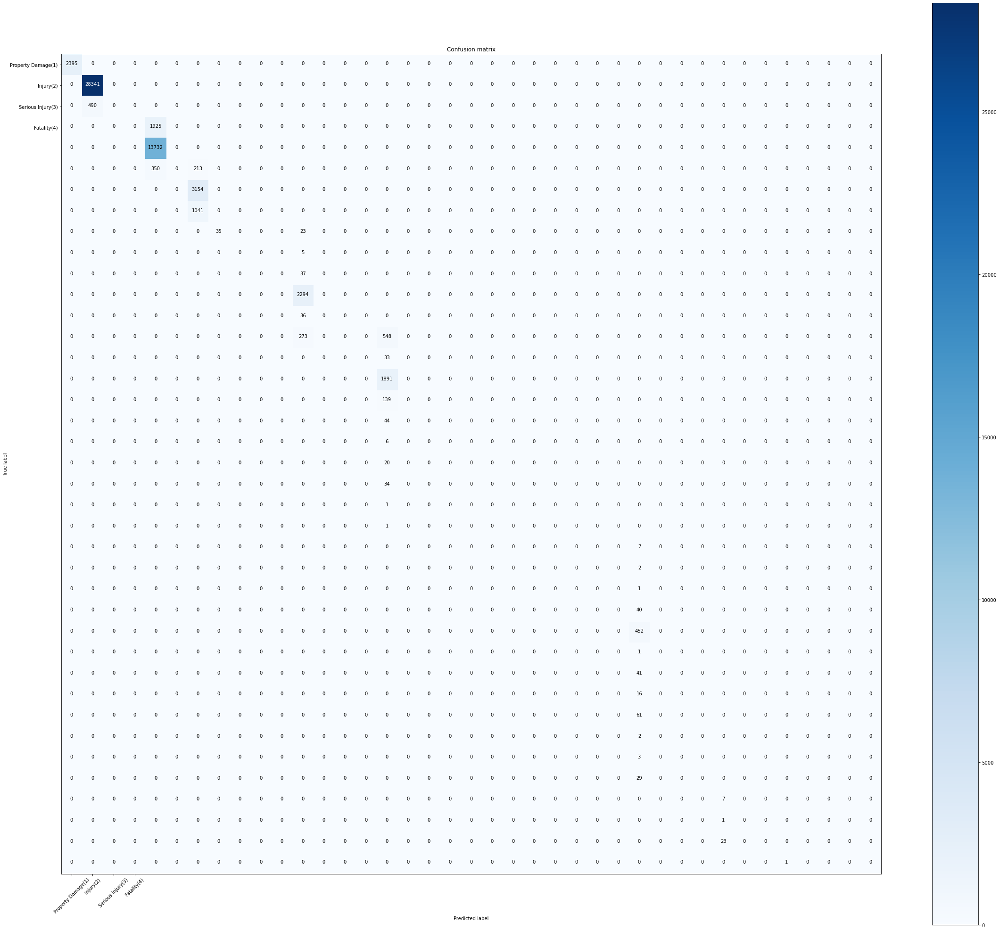

In [39]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, yhat)
np.set_printoptions(precision=2)

print (classification_report(y_test, yhat))

# Plot non-normalized confusion matrix
plt.figure(figsize=(32,28))
plot_confusion_matrix(cnf_matrix, classes=['Property Damage(1)','Injury(2)','Serious Injury(3)','Fatality(4)'],normalize= False,  title='Confusion matrix')

In [40]:
matrix=pd.DataFrame(cnf_matrix)

In [41]:
np.diagonal(matrix)

array([ 2395, 28341,     0,     0, 13732,     0,  3154,     0,     0,
           0,     0,  2294,     0,     0,     0,  1891,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
         452,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0], dtype=int64)

In [42]:
Collisions['SDOT_COLCODE'].value_counts()

11.0    70665
14.0    34397
16.0     7955
0.0      6018
24.0     5791
28.0     4806
13.0     4623
18.0     2639
26.0     2138
15.0     1342
12.0     1209
51.0     1145
29.0      365
56.0      148
21.0      141
23.0      106
48.0      103
31.0       98
54.0       92
34.0       87
27.0       85
25.0       82
64.0       77
69.0       62
33.0       53
55.0       44
66.0       22
44.0       14
22.0       13
32.0       11
61.0        7
53.0        6
35.0        6
58.0        5
36.0        4
68.0        3
46.0        3
52.0        1
47.0        1
87.0        1
Name: SDOT_COLCODE, dtype: int64

We can see that this SVM model performs poorly when predicting accidents of severity 2, 3 and 4. This might be related to an inbalcen in our Y's data. Let's take a look

There is a big unbalance between data labels, we need to find a way to make up for the data unbalance.

### Decision Tree <a name="Decision_tree"></a>

In [43]:
import numpy as np 
import pandas as pd
from sklearn.tree import DecisionTreeClassifier

In [44]:
#set entropy so we can see the information gain
colsTree = DecisionTreeClassifier(criterion="entropy", max_depth = 4)
colsTree # it shows the default parameters

DecisionTreeClassifier(criterion='entropy', max_depth=4)

In [45]:
colsTree.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4)

In [46]:
predTree = colsTree.predict(X_test)
print (predTree [0:5])
print (y_test [0:5])

[13. 28. 28. 16. 11.]
        SDOT_COLCODE
23899           13.0
127162          51.0
121840          28.0
49979           16.0
31530           11.0


In [47]:
from sklearn import metrics
import matplotlib.pyplot as plt
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_test, predTree))

DecisionTrees's Accuracy:  0.9569682066911408


In [48]:
# Notice: You might need to uncomment and install the pydotplus and graphviz libraries if you have not installed these before
#!conda install -c conda-forge pydotplus -y
#!conda install -c conda-forge python-graphviz -y

import io
import pydotplus
import matplotlib.image as mpimg
from sklearn import tree
%matplotlib inline 

In [83]:
dot_data = io.StringIO()
filename = "colstree.png"
featureNames = SVMODEL.columns[0:6]
targetNames = SVMODEL["SEVERITYCODE"].unique().tolist()
out = tree.export_graphviz(colsTree, feature_names=featureNames, out_file=dot_data, class_names= str(np.unique(y_train)), filled=True,  special_characters=True,rotate=False)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(200, 400))
plt.imshow(img,interpolation='nearest')